# MissOh DataLoader

### AnotherMissOh Visual Structure
- json_data['file_name'] : 'AnotherMissOh01.mp4'
- json_data['visual_results']
- json_data['visual_results'][0].keys() : dict_keys(['start_time', 'end_time', 'vid', 'image_info'])
- {
'start_time': '00:02:51;16', 
'end_time': '00:02:54;15', 
'vid': 'AnotherMissOh01_001_0078', 
'image_info': ...}
- json_data['visual_results'][0]['image_info']
- [{'frame_id': 'AnotherMissOh01_001_0078_IMAGE_0000004295', 
'place': 'none', 
'persons': [
{'person_id': 'Haeyoung1', 
'person_info': {
'face_rect': {'min_x': 515, 'min_y': 0, 'max_x': 845, 'max_y': 443}, 
'full_rect': {'min_x': 278, 'min_y': 2, 'max_x': 1025, 'max_y': 769}, 
'behavior': 'stand up', 
'predicate': 'none', 
'emotion': 'Neutral', 
'face_rect_score': '0.5', 
'full_rect_score': '0.9'}, 
'related_objects': []}], 
'objects': []}, 
- {'frame_id': 'AnotherMissOh01_001_0078_IMAGE_0000004311', 
'place': '', 
'persons': [{
'person_id':'Haeyoung1',
'person_info': {
'face_rect': {'min_x': 515, 'min_y': 0, 'max_x': 831, 'max_y': 411}, 
'full_rect': {'min_x': 270, 'min_y': 0, 'max_x': 1025, 'max_y': 768}, 
'behavior': 'stand up', 
'predicate': 'none', 
'emotion': 'Neutral', 
'face_rect_score': '0.5', 
'full_rect_score': '0.9'}, 
'related_objects': []}],
'objects': []},]

In [1]:
import sys
sys.path.append("../") # go to parent dir

In [91]:
import os
from torch.utils.data import Dataset, DataLoader
import cv2
import pickle
import numpy as np
import glob
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from PIL import Image
import json
import argparse
import matplotlib.pyplot as plt

from Yolo_v2_pytorch.src.utils import *
from graphviz import Digraph, Graph

import ipdb

In [3]:
MissOh_CLASSES = ['person']
print(MissOh_CLASSES[0])
global colors
colors = pickle.load(open("../Yolo_v2_pytorch/src/pallete", "rb"))
print(colors[0])

person
(39, 129, 113)


In [4]:
def get_args():
    parser = argparse.ArgumentParser(
        "You Only Look Once:Unified, Real-Time Object Detection")
    parser.add_argument("--image_size", type=int,
                        default=448,
                        help="The common width and height for all images")
    parser.add_argument("--batch_size", type=int, default=1,
                        help="The number of images per batch")
    # Training base Setting
    parser.add_argument("--momentum", type=float, default=0.9)
    parser.add_argument("--decay", type=float, default=0.0005)
    parser.add_argument("--dropout", type=float, default=0.5)
    parser.add_argument("--num_epoches", type=int, default=100)
    parser.add_argument("--test_interval", type=int, default=1,
                        help="Number of epoches between testing phases")
    parser.add_argument("--object_scale", type=float, default=1.0)
    parser.add_argument("--noobject_scale", type=float, default=0.5)
    parser.add_argument("--class_scale", type=float, default=1.0)
    parser.add_argument("--coord_scale", type=float, default=5.0)
    parser.add_argument("--reduction", type=int, default=32)
    parser.add_argument("--es_min_delta", type=float, default=0.0,
                        help="Early stopping's parameter:minimum change loss to qualify as an improvement")
    parser.add_argument("--es_patience", type=int, default=0,
                        help="Early stopping's parameter:number of epochs with no improvement after which training will be stopped. Set to 0 to disable this technique.")

    parser.add_argument("--pre_trained_model_type",
                        type=str, choices=["model", "params"],
                        default="model")
    parser.add_argument("--pre_trained_model_path", type=str,
                        default="Yolo_v2_pytorch/trained_models/only_params_trained_yolo_voc") # Pre-training path

    parser.add_argument("--saved_path", type=str,
                        default="./checkpoint") # saved training path
    parser.add_argument("--conf_threshold", type=float, default=0.35)
    parser.add_argument("--nms_threshold", type=float, default=0.5)
    args = parser.parse_args(args=[]) # for jupyter 
    return args

In [5]:
opt = get_args()
print(opt)

Namespace(batch_size=1, class_scale=1.0, conf_threshold=0.35, coord_scale=5.0, decay=0.0005, dropout=0.5, es_min_delta=0.0, es_patience=0, image_size=448, momentum=0.9, nms_threshold=0.5, noobject_scale=0.5, num_epoches=100, object_scale=1.0, pre_trained_model_path='Yolo_v2_pytorch/trained_models/only_params_trained_yolo_voc', pre_trained_model_type='model', reduction=32, saved_path='./checkpoint', test_interval=1)


In [6]:
#splits
num_episode = 10
train = [1]
val = [5]
test = [6,7]
#return train, val, test

In [7]:
img_path = '../data/AnotherMissOh/AnotherMissOh_images/'
json_path = '../data/AnotherMissOh/AnotherMissOh_Visual/'

dataset = train

for episode in dataset:
    img_dir = '../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh{:02}/'.format(episode)
    json_dir = '../data/AnotherMissOh/AnotherMissOh_Visual/AnotherMissOh{:02}_visual.json'.format(episode)

    print('imag_dir:{}'.format(img_dir))
    print('json_dir:{}'.format(json_dir))


    with open(json_dir, encoding='utf-8') as json_file:
        json_data = json.load(json_file)

    for i in range(len(json_data['visual_results'])):
        print("***{}th episode***{}th clips***************************************".format(episode, i))
        print("['visual_results'][{}]['start_time']:{}".format(i,json_data['visual_results'][i]['start_time']))
        print("['visual_results'][{}]['end_time']:{}".format(i,json_data['visual_results'][i]['end_time']))
        print("['visual_results'][{}]['vid']:{}".format(i,json_data['visual_results'][i]['vid'].replace('_', '/')))
        img_size = [1024, 768]
        img_scaled_size = [448, 448]
        print("['visual_results'][{}]['img_size']:{}".format(i,img_size))
        print("['visual_results'][{}]['img_scaled_size']:{}".format(i,img_scaled_size))
        print("['visual_results'][{}]['episode']:{}".format(i,episode))
        for j, info in enumerate(json_data['visual_results'][i]['image_info']):
            print("=============={}th frame========================================".format(j))
            print("image_info['frame_id']: {}".format(info['frame_id']).replace('_', '/'))
            print("image_info['place']: {}".format(info['place']))
            for k, person in enumerate(info['persons']):
                print("--------------------{}th person-----------------------------".format(k))
                print("image_info['persons_id']: {}".format(person['person_id']))
                face_bbox = person['person_info']['face_rect']
                if (face_bbox['min_y'] == "" 
                    or face_bbox['max_y'] == "" 
                    or face_bbox['min_x'] == "" 
                    or face_bbox['max_x'] == ""):
                    face_rect = []
                    continue
                else:
                    face_rect = [face_bbox['min_x'], face_bbox['min_y'], face_bbox['max_x'], face_bbox['max_y']]
                print("image_info['persons_info']['face_rect']:{}".format(face_rect))
                full_bbox = person['person_info']['full_rect']
                if (full_bbox['min_y'] == "" 
                    or full_bbox['max_y'] == "" 
                    or full_bbox['min_x'] == "" 
                    or full_bbox['max_x'] == ""):
                    full_rect = []
                    continue
                else:
                    full_rect = [full_bbox['min_x'], full_bbox['min_y'], full_bbox['max_x'], full_bbox['max_y']]
                print("image_info['persons_info']['full_rect']:{}".format(full_rect))
                print("image_info['persons_info']['behavior']:{}".format(person['person_info']['behavior']))
                print("image_info['persons_info']['predicate']:{}".format(person['person_info']['predicate']))
                print("image_info['persons_info']['emotion']:{}".format(person['person_info']['emotion']))
                print("image_info['persons_info']['face_rect_score']:{}".format(person['person_info']['face_rect_score']))
                print("image_info['persons_info']['full_rect_score']:{}".format(person['person_info']['full_rect_score']))

imag_dir:../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/
json_dir:../data/AnotherMissOh/AnotherMissOh_Visual/AnotherMissOh01_visual.json
***1th episode***0th clips***************************************
['visual_results'][0]['start_time']:00:02:51;16
['visual_results'][0]['end_time']:00:02:54;15
['visual_results'][0]['vid']:AnotherMissOh01/001/0078
['visual_results'][0]['img_size']:[1024, 768]
['visual_results'][0]['img_scaled_size']:[448, 448]
['visual_results'][0]['episode']:1
==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/001/0078/IMAGE/0000004295
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[515, 0, 845, 443]
image_info['persons_info']['full_rect']:[278, 2, 1025, 769]
image_info['persons_info']['behavior']:stand up
image_info['persons_info']['predicate']:none
image_info['persons_info']['emotion']:Ne

image_info['persons_info']['face_rect_score']:0.4
image_info['persons_info']['full_rect_score']:0.9
==============55th frame========================================
image/info['frame/id']: AnotherMissOh01/001/0095/IMAGE/0000005752
image_info['place']: livingroom
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[183, 264, 253, 362]
image_info['persons_info']['full_rect']:[99, 178, 323, 626]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.5
image_info['persons_info']['full_rect_score']:0.9
--------------------1th person-----------------------------
image_info['persons_id']: Deogi
image_info['persons_info']['face_rect']:[776, 348, 817, 403]
==============56th frame========================================
image/info['frame/id']: AnotherMissOh01/001/0095/IMAGE/0000005760
image_i

image/info['frame/id']: AnotherMissOh01/001/0104/IMAGE/0000006807
image_info['place']: livingroom
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[234, 273, 316, 384]
image_info['persons_info']['full_rect']:[142, 212, 378, 656]
image_info['persons_info']['behavior']:eat
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Sadness
image_info['persons_info']['face_rect_score']:0.4
image_info['persons_info']['full_rect_score']:0.9
--------------------1th person-----------------------------
image_info['persons_id']: Deogi
image_info['persons_info']['face_rect']:[578, 98, 649, 224]
image_info['persons_info']['full_rect']:[500, 3, 868, 769]
image_info['persons_info']['behavior']:stand up
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
==========

image_info['persons_info']['face_rect_score']:0.3
image_info['persons_info']['full_rect_score']:0.9
==============4th frame========================================
image/info['frame/id']: AnotherMissOh01/001/0139/IMAGE/0000008586
image_info['place']: kitchen
--------------------0th person-----------------------------
image_info['persons_id']: Deogi
image_info['persons_info']['face_rect']:[310, 102, 645, 557]
image_info['persons_info']['full_rect']:[3, 0, 735, 749]
image_info['persons_info']['behavior']:call
image_info['persons_info']['predicate']:has
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.3
image_info['persons_info']['full_rect_score']:0.9
==============5th frame========================================
image/info['frame/id']: AnotherMissOh01/001/0139/IMAGE/0000008594
image_info['place']: kitchen
--------------------0th person-----------------------------
image_info['persons_id']: Deogi
image_info['persons_info']['face_rect']:[311, 10

image/info['frame/id']: AnotherMissOh01/002/0167/IMAGE/0000010352
image_info['place']: room
--------------------0th person-----------------------------
image_info['persons_id']: Deogi
image_info['persons_info']['face_rect']:[226, 213, 475, 519]
image_info['persons_info']['full_rect']:[131, 60, 675, 768]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Sadness
image_info['persons_info']['face_rect_score']:
image_info['persons_info']['full_rect_score']:0.9
==============23th frame========================================
image/info['frame/id']: AnotherMissOh01/002/0167/IMAGE/0000010360
image_info['place']: room
--------------------0th person-----------------------------
image_info['persons_id']: Deogi
image_info['persons_info']['face_rect']:[202, 150, 565, 513]
image_info['persons_info']['full_rect']:[0, 0, 994, 766]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['per

image_info['persons_info']['behavior']:walk
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:0.6
image_info['persons_info']['full_rect_score']:0.9
==============34th frame========================================
image/info['frame/id']: AnotherMissOh01/003/0201/IMAGE/0000012545
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[539, 242, 772, 562]
image_info['persons_info']['full_rect']:[288, 96, 979, 766]
image_info['persons_info']['behavior']:walk
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:0.6
image_info['persons_info']['full_rect_score']:0.9
==============35th frame========================================
image/info['frame/id']: AnotherMissOh01/003/0201/IMAGE/0000012553
image_info['place']: none
---

['visual_results'][160]['episode']:1
==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/004/0245/IMAGE/0000014870
image_info['place']: office
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[423, 28, 728, 435]
image_info['persons_info']['full_rect']:[302, 0, 983, 758]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/004/0245/IMAGE/0000014878
image_info['place']: office
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[423, 28, 728, 435]
image_info['persons_info']['full_rect']:[29

==============2th frame========================================
image/info['frame/id']: AnotherMissOh01/004/0276/IMAGE/0000016450
image_info['place']: office
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[517, 89, 782, 491]
image_info['persons_info']['full_rect']:[283, 0, 1003, 766]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
==============3th frame========================================
image/info['frame/id']: AnotherMissOh01/004/0276/IMAGE/0000016458
image_info['place']: office
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[520, 88, 785, 490]
image_info['persons_info']['full_rect']:[283, 0, 1003, 766]
image_info['persons_inf

--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[557, 28, 848, 454]
image_info['persons_info']['full_rect']:[278, 0, 959, 755]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
==============5th frame========================================
image/info['frame/id']: AnotherMissOh01/004/0299/IMAGE/0000017954
image_info['place']: office
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[557, 28, 848, 454]
image_info['persons_info']['full_rect']:[276, 4, 962, 767]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.9
imag

image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
***1th episode***245th clips***************************************
['visual_results'][245]['start_time']:00:13:21;10
['visual_results'][245]['end_time']:00:13:22;09
['visual_results'][245]['vid']:AnotherMissOh01/005/0330
['visual_results'][245]['img_size']:[1024, 768]
['visual_results'][245]['img_scaled_size']:[448, 448]
['visual_results'][245]['episode']:1
==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/005/0330/IMAGE/0000020039
image_info['place']: office
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[538, 70, 829, 481]
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/005/0330/IMAGE/0000020047
image_info['place']: 
--------------------0th perso

==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/006/0366/IMAGE/0000022712
image_info['place']: studio
--------------------0th person-----------------------------
image_info['persons_id']: Sangseok
image_info['persons_info']['face_rect']:[312, 56, 718, 599]
image_info['persons_info']['full_rect']:[36, 0, 1015, 767]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Sadness
image_info['persons_info']['face_rect_score']:
image_info['persons_info']['full_rect_score']:0.9
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/006/0366/IMAGE/0000022720
image_info['place']: studio
--------------------0th person-----------------------------
image_info['persons_id']: Sangseok
image_info['persons_info']['face_rect']:[146, 12, 552, 555]
image_info['persons_info']['full_rect']:[36, 0, 1015, 767]
image_info['persons_info']['

image_info['persons_info']['full_rect']:[46, 131, 310, 764]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:
image_info['persons_info']['full_rect_score']:0.9
==============9th frame========================================
image/info['frame/id']: AnotherMissOh01/006/0378/IMAGE/0000023973
image_info['place']: studio
--------------------0th person-----------------------------
image_info['persons_id']: Gitae
image_info['persons_info']['face_rect']:[725, 80, 827, 235]
image_info['persons_info']['full_rect']:[619, 36, 935, 736]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
--------------------1th person-----------------------------
image_info['persons_id']: Sangseok
image_info['person

image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
==============16th frame========================================
image/info['frame/id']: AnotherMissOh01/007/0399/IMAGE/0000025744
image_info['place']: studio
--------------------0th person-----------------------------
image_info['persons_id']: Hun
image_info['persons_info']['face_rect']:[169, 127, 371, 406]
image_info['persons_info']['full_rect']:[3, 0, 485, 747]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.6
image_info['persons_info']['full_rect_score']:0.9
--------------------1th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[524, 175, 685, 396]
image_info['persons_info']['full_rect']:[401, 93, 1016, 769]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
i

image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.5
image_info['persons_info']['full_rect_score']:
--------------------2th person-----------------------------
image_info['persons_id']: Gitae
image_info['persons_info']['face_rect']:[771, 279, 837, 377]
image_info['persons_info']['full_rect']:[605, 155, 1016, 728]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:
image_info['persons_info']['full_rect_score']:0.9
***1th episode***325th clips***************************************
['visual_results'][325]['start_time']:00:18:03;17
['visual_results'][325]['end_time']:00:18:07;14
['visual_results'][325]['vid']:AnotherMissOh01/007/0410
['visual_results'][325]['img_size']:[1024, 768]
['visual_results'][325]['img_scaled_size']:[448, 448]
['visual_results'][325]['episode']:1
==============

image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
==============3th frame========================================
image/info['frame/id']: AnotherMissOh01/007/0426/IMAGE/0000028326
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Hun
image_info['persons_info']['face_rect']:[534, 101, 810, 532]
image_info['persons_info']['full_rect']:[107, 0, 1005, 767]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:0.6
image_info['persons_info']['full_rect_score']:0.9
==============4th frame========================================
image/info['frame/id']: AnotherMissOh01/007/0426/IMAGE/0000028334
image_info['place']: none
--------------------0th person---------------------------

image/info['frame/id']: AnotherMissOh01/008/0468/IMAGE/0000030787
image_info['place']: none
==============18th frame========================================
image/info['frame/id']: AnotherMissOh01/008/0468/IMAGE/0000030795
image_info['place']: none
==============19th frame========================================
image/info['frame/id']: AnotherMissOh01/008/0468/IMAGE/0000030803
image_info['place']: none
***1th episode***383th clips***************************************
['visual_results'][383]['start_time']:00:20:32;12
['visual_results'][383]['end_time']:00:20:33;15
['visual_results'][383]['vid']:AnotherMissOh01/008/0469
['visual_results'][383]['img_size']:[1024, 768]
['visual_results'][383]['img_scaled_size']:[448, 448]
['visual_results'][383]['episode']:1
==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/008/0469/IMAGE/0000030816
image_info['place']: none
==============1th frame========================================
image/info['f

==============2th frame========================================
image/info['frame/id']: AnotherMissOh01/009/0492/IMAGE/0000032763
image_info['place']: restaurant
--------------------0th person-----------------------------
image_info['persons_id']: Heeran
image_info['persons_info']['face_rect']:[545, 149, 690, 371]
image_info['persons_info']['full_rect']:[406, 31, 845, 764]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============3th frame========================================
image/info['frame/id']: AnotherMissOh01/009/0492/IMAGE/0000032771
image_info['place']: restaurant
--------------------0th person-----------------------------
image_info['persons_id']: Heeran
image_info['persons_info']['face_rect']:[545, 151, 690, 373]
image_info['persons_info']['full_rect']:[406, 31, 845, 764]
image_info['perso

image_info['persons_info']['predicate']:has
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
--------------------1th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[563, 136, 680, 329]
image_info['persons_info']['full_rect']:[544, 83, 902, 750]
image_info['persons_info']['behavior']:walk
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============28th frame========================================
image/info['frame/id']: AnotherMissOh01/009/0506/IMAGE/0000034083
image_info['place']: road
--------------------0th person-----------------------------
image_info['persons_id']: Heeran
image_info['persons_info']['face_rect']:[240, 93, 376, 282]
image_info['persons_info']['full_rect']:[78, 36, 498

image_info['persons_info']['behavior']:walk
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============26th frame========================================
image/info['frame/id']: AnotherMissOh01/010/0519/IMAGE/0000035593
image_info['place']: road
--------------------0th person-----------------------------
image_info['persons_id']: Jinsang
image_info['persons_info']['face_rect']:[169, 232, 290, 415]
image_info['persons_info']['full_rect']:[41, 74, 480, 769]
image_info['persons_info']['behavior']:walk
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.4
image_info['persons_info']['full_rect_score']:0.9
--------------------1th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[624, 159, 755, 328]
image_info['

image/info['frame/id']: AnotherMissOh01/010/0538/IMAGE/0000036818
image_info['place']: road
--------------------0th person-----------------------------
image_info['persons_id']: Jinsang
image_info['persons_info']['face_rect']:[359, 107, 505, 314]
image_info['persons_info']['full_rect']:[202, 31, 722, 769]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Sadness
image_info['persons_info']['face_rect_score']:0.5
image_info['persons_info']['full_rect_score']:0.9
==============2th frame========================================
image/info['frame/id']: AnotherMissOh01/010/0538/IMAGE/0000036826
image_info['place']: road
--------------------0th person-----------------------------
image_info['persons_id']: Jinsang
image_info['persons_info']['face_rect']:[365, 112, 511, 319]
image_info['persons_info']['full_rect']:[202, 31, 722, 769]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_

==============3th frame========================================
image/info['frame/id']: AnotherMissOh01/011/0563/IMAGE/0000038892
image_info['place']: kitchen
--------------------0th person-----------------------------
image_info['persons_id']: Deogi
image_info['persons_info']['face_rect']:[458, 173, 755, 579]
image_info['persons_info']['full_rect']:[107, 0, 973, 767]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
==============4th frame========================================
image/info['frame/id']: AnotherMissOh01/011/0563/IMAGE/0000038900
image_info['place']: kitchen
--------------------0th person-----------------------------
image_info['persons_id']: Deogi
image_info['persons_info']['face_rect']:[462, 183, 759, 589]
image_info['persons_info']['full_rect']:[107, 0, 973, 767]
image_info['persons_info'][

--------------------0th person-----------------------------
image_info['persons_id']: Deogi
image_info['persons_info']['face_rect']:[448, 137, 726, 543]
image_info['persons_info']['full_rect']:[249, 0, 949, 762]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
***1th episode***490th clips***************************************
['visual_results'][490]['start_time']:00:26:53;03
['visual_results'][490]['end_time']:00:27:00;13
['visual_results'][490]['vid']:AnotherMissOh01/011/0583
['visual_results'][490]['img_size']:[1024, 768]
['visual_results'][490]['img_scaled_size']:[448, 448]
['visual_results'][490]['episode']:1
==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/011/0583/IMAGE/0000040332
image_info['place']: kitchen
--------------------0th person-------

['visual_results'][515]['vid']:AnotherMissOh01/013/0608
['visual_results'][515]['img_size']:[1024, 768]
['visual_results'][515]['img_scaled_size']:[448, 448]
['visual_results'][515]['episode']:1
==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/013/0608/IMAGE/0000042337
image_info['place']: studio
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/013/0608/IMAGE/0000042345
image_info['place']: studio
==============2th frame========================================
image/info['frame/id']: AnotherMissOh01/013/0608/IMAGE/0000042353
image_info['place']: studio
***1th episode***516th clips***************************************
['visual_results'][516]['start_time']:00:28:14;12
['visual_results'][516]['end_time']:00:28:27;03
['visual_results'][516]['vid']:AnotherMissOh01/013/0609
['visual_results'][516]['img_size']:[1024, 768]
['visual_results'][516]['img_scaled_size']:[448, 448]
['visua

image_info['persons_id']: Jiya
image_info['persons_info']['face_rect']:[865, 388, 906, 453]
image_info['persons_info']['full_rect']:[776, 369, 973, 599]
image_info['persons_info']['behavior']:sit down
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.6
image_info['persons_info']['full_rect_score']:0.9
--------------------1th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[127, 189, 178, 260]
image_info['persons_info']['full_rect']:[102, 140, 243, 565]
image_info['persons_info']['behavior']:stand up
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
==============7th frame========================================
image/info['frame/id']: AnotherMissOh01/014/0622/IMAGE/0000044073
image_info['place']: office
---

['visual_results'][551]['start_time']:00:30:22;20
['visual_results'][551]['end_time']:00:30:23;19
['visual_results'][551]['vid']:AnotherMissOh01/015/0644
['visual_results'][551]['img_size']:[1024, 768]
['visual_results'][551]['img_scaled_size']:[448, 448]
['visual_results'][551]['episode']:1
==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/015/0644/IMAGE/0000045574
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Hun
image_info['persons_info']['face_rect']:[424, 153, 641, 508]
image_info['persons_info']['full_rect']:[186, 0, 723, 752]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/015/06

image_info['persons_info']['full_rect_score']:0.9
==============16th frame========================================
image/info['frame/id']: AnotherMissOh01/016/0694/IMAGE/0000048351
image_info['place']: restaurant
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[504, 58, 772, 484]
image_info['persons_info']['full_rect']:[121, 0, 954, 752]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============17th frame========================================
image/info['frame/id']: AnotherMissOh01/016/0694/IMAGE/0000048359
image_info['place']: restaurant
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[520, 65, 788, 491]
image_info['persons_

image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
==============12th frame========================================
image/info['frame/id']: AnotherMissOh01/016/0713/IMAGE/0000050432
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[691, 182, 751, 275]
image_info['persons_info']['full_rect']:[599, 88, 916, 769]
image_info['persons_info']['behavior']:stand up
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
==============13th frame========================================
image/info['frame/id']: AnotherMissOh01/016/0713/IMAGE/0000050408
image_info['place']: none
--------------------0th person-------------

image_info['persons_info']['full_rect']:[55, 122, 277, 714]
image_info['persons_info']['behavior']:sit down
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:
image_info['persons_info']['full_rect_score']:0.9
==============4th frame========================================
image/info['frame/id']: AnotherMissOh01/018/0747/IMAGE/0000052496
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[798, 197, 863, 304]
image_info['persons_info']['full_rect']:[640, 75, 979, 765]
image_info['persons_info']['behavior']:sit down
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
--------------------1th person-----------------------------
image_info['persons_id']: Heeran
ima

image_info['persons_info']['full_rect']:[141, 8, 727, 765]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.5
image_info['persons_info']['full_rect_score']:0.9
==============4th frame========================================
image/info['frame/id']: AnotherMissOh01/019/0771/IMAGE/0000055354
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Jinsang
image_info['persons_info']['face_rect']:[557, 132, 745, 415]
image_info['persons_info']['full_rect']:[359, 25, 1013, 764]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:wearing
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============5th frame========================================
image/info['frame/id']: AnotherMissOh0

image/info['frame/id']: AnotherMissOh01/020/0789/IMAGE/0000057076
image_info['place']: toilet
==============7th frame========================================
image/info['frame/id']: AnotherMissOh01/020/0789/IMAGE/0000057084
image_info['place']: toilet
==============8th frame========================================
image/info['frame/id']: AnotherMissOh01/020/0789/IMAGE/0000057092
image_info['place']: toilet
==============9th frame========================================
image/info['frame/id']: AnotherMissOh01/020/0789/IMAGE/0000057100
image_info['place']: toilet
==============10th frame========================================
image/info['frame/id']: AnotherMissOh01/020/0789/IMAGE/0000057108
image_info['place']: toilet
==============11th frame========================================
image/info['frame/id']: AnotherMissOh01/020/0789/IMAGE/0000057124
image_info['place']: toilet
==============12th frame========================================
image/info['frame/id']: AnotherMissOh01/020/0789/

['visual_results'][719]['img_scaled_size']:[448, 448]
['visual_results'][719]['episode']:1
==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/022/0825/IMAGE/0000059622
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[671, 327, 841, 562]
image_info['persons_info']['full_rect']:[502, 121, 1022, 768]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/022/0825/IMAGE/0000059630
image_info['place']: none
==============2th frame========================================
image/info['frame/id']: AnotherMissOh01/022/0825/IMAGE/0000059638
image_info['place']

==============6th frame========================================
image/info['frame/id']: AnotherMissOh01/022/0841/IMAGE/0000061067
image_info['place']: 
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[549, 36, 942, 570]
image_info['persons_info']['full_rect']:[363, 0, 1015, 767]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
==============7th frame========================================
image/info['frame/id']: AnotherMissOh01/022/0841/IMAGE/0000061075
image_info['place']: 
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[561, 26, 954, 560]
image_info['persons_info']['full_rect']:[363, 0, 1015, 767]
image_info['persons_info']['behav

image_info['persons_id']: Deogi
image_info['persons_info']['face_rect']:[194, 246, 312, 435]
image_info['persons_info']['full_rect']:[188, 131, 504, 769]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.3
image_info['persons_info']['full_rect_score']:0.9
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/024/0858/IMAGE/0000062478
image_info['place']: kitchen
==============2th frame========================================
image/info['frame/id']: AnotherMissOh01/024/0858/IMAGE/0000062486
image_info['place']: kitchen
==============3th frame========================================
image/info['frame/id']: AnotherMissOh01/024/0858/IMAGE/0000062494
image_info['place']: kitchen
==============4th frame========================================
image/info['frame/id']: AnotherMissOh01/024/0858/IMAGE/0000062502
image_in

image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============4th frame========================================
image/info['frame/id']: AnotherMissOh01/025/0894/IMAGE/0000065132
image_info['place']: garden
--------------------0th person-----------------------------
image_info['persons_id']: Hun
image_info['persons_info']['face_rect']:[462, 102, 593, 296]
image_info['persons_info']['full_rect']:[363, 0, 841, 768]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============5th frame========================================
image/info['frame/id']: AnotherMissOh01/025/0894/IMAGE/0000065140
image_info['place']: garden
--------------------0th person--------------------------

image_info['persons_info']['emotion']:Sadness
image_info['persons_info']['face_rect_score']:0.3
image_info['persons_info']['full_rect_score']:0.9
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/026/0943/IMAGE/0000067996
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Hun
image_info['persons_info']['face_rect']:[226, 35, 642, 569]
image_info['persons_info']['full_rect']:[0, 0, 799, 766]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Sadness
image_info['persons_info']['face_rect_score']:0.3
image_info['persons_info']['full_rect_score']:0.9
==============2th frame========================================
image/info['frame/id']: AnotherMissOh01/026/0943/IMAGE/0000068004
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Hun
image_info['pe

--------------------1th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[374, 164, 443, 248]
image_info['persons_info']['full_rect']:[311, 104, 453, 616]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:
image_info['persons_info']['full_rect_score']:
==============5th frame========================================
image/info['frame/id']: AnotherMissOh01/028/0976/IMAGE/0000070167
image_info['place']: restaurant
--------------------0th person-----------------------------
image_info['persons_id']: Sukyung
image_info['persons_info']['face_rect']:[420, 180, 513, 306]
image_info['persons_info']['full_rect']:[367, 88, 663, 769]
image_info['persons_info']['behavior']:eat
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.1
im

['visual_results'][898]['start_time']:00:48:05;15
['visual_results'][898]['end_time']:00:48:05;18
['visual_results'][898]['vid']:AnotherMissOh01/028/1008
['visual_results'][898]['img_size']:[1024, 768]
['visual_results'][898]['img_scaled_size']:[448, 448]
['visual_results'][898]['episode']:1
==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/028/1008/IMAGE/0000072141
image_info['place']: restaurant
--------------------0th person-----------------------------
image_info['persons_id']: Sukyung
image_info['persons_info']['face_rect']:[476, 206, 703, 518]
***1th episode***899th clips***************************************
['visual_results'][899]['start_time']:00:48:05;19
['visual_results'][899]['end_time']:00:48:06;02
['visual_results'][899]['vid']:AnotherMissOh01/028/1009
['visual_results'][899]['img_size']:[1024, 768]
['visual_results'][899]['img_scaled_size']:[448, 448]
['visual_results'][899]['episode']:1
==============0th frame======

image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
==============14th frame========================================
image/info['frame/id']: AnotherMissOh01/029/1028/IMAGE/0000073784
image_info['place']: restaurant
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[533, 64, 835, 475]
image_info['persons_info']['full_rect']:[188, 3, 1016, 770]
image_info['persons_info']['behavior']:drink
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
==============15th frame========================================
image/info['frame/id']: AnotherMissOh01/029/1028/IMAGE/0000073792
image_info['place']: restaurant
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['fa

image/info['frame/id']: AnotherMissOh01/030/1048/IMAGE/0000075711
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[511, 101, 785, 463]
image_info['persons_info']['full_rect']:[243, 0, 979, 766]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/030/1048/IMAGE/0000075719
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[552, 122, 826, 485]
image_info['persons_info']['full_rect']:[244, 0, 981, 766]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
imag

image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[259, 194, 342, 311]
image_info['persons_info']['full_rect']:[168, 83, 480, 769]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
==============5th frame========================================
image/info['frame/id']: AnotherMissOh01/030/1073/IMAGE/0000077207
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Sukyung
image_info['persons_info']['face_rect']:[808, 98, 887, 224]
image_info['persons_info']['full_rect']:[654, 22, 942, 769]
image_info['persons_info']['behavior']:stand up
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.5
image_info['persons_info']['full_rect_score']:0.9
-------

--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[644, 50, 851, 337]
image_info['persons_info']['full_rect']:[416, 0, 1007, 762]
image_info['persons_info']['behavior']:
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
***1th episode***977th clips***************************************
['visual_results'][977]['start_time']:00:52:57;13
['visual_results'][977]['end_time']:00:53:00;13
['visual_results'][977]['vid']:AnotherMissOh01/031/1089
['visual_results'][977]['img_size']:[1024, 768]
['visual_results'][977]['img_scaled_size']:[448, 448]
['visual_results'][977]['episode']:1
==============0th frame========================================
image/info['frame/id']: AnotherMissOh01/031/1089/IMAGE/0000079442
image_info['place']: cafe
--------------------0th person----------

image_info['persons_info']['full_rect_score']:0.9
==============34th frame========================================
image/info['frame/id']: AnotherMissOh01/032/1110/IMAGE/0000081417
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[727, 206, 792, 300]
image_info['persons_info']['full_rect']:[632, 136, 953, 769]
image_info['persons_info']['behavior']:walk
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Sadness
image_info['persons_info']['face_rect_score']:0.4
image_info['persons_info']['full_rect_score']:0.9
==============35th frame========================================
image/info['frame/id']: AnotherMissOh01/032/1110/IMAGE/0000081425
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[744, 179, 823, 297]
image_info['persons_info']['fu

==============23th frame========================================
image/info['frame/id']: AnotherMissOh01/034/1121/IMAGE/0000083310
image_info['place']: park
--------------------0th person-----------------------------
image_info['persons_id']: Hun
image_info['persons_info']['face_rect']:[549, 146, 647, 283]
image_info['persons_info']['full_rect']:[481, 46, 853, 769]
image_info['persons_info']['behavior']:stand up
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
--------------------1th person-----------------------------
image_info['persons_id']: Anna
image_info['persons_info']['face_rect']:[312, 130, 424, 290]
image_info['persons_info']['full_rect']:[156, 79, 657, 769]
image_info['persons_info']['behavior']:stand up
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Happiness
image_info['persons_info']['face_rect_score']:

--------------------0th person-----------------------------
image_info['persons_id']: Heeran
image_info['persons_info']['face_rect']:[315, 122, 471, 373]
image_info['persons_info']['full_rect']:[168, 17, 654, 755]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:in front of
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
==============4th frame========================================
image/info['frame/id']: AnotherMissOh01/035/1140/IMAGE/0000084730
image_info['place']: cafe
--------------------0th person-----------------------------
image_info['persons_id']: Heeran
image_info['persons_info']['face_rect']:[316, 145, 472, 396]
image_info['persons_info']['full_rect']:[169, 17, 655, 755]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:in front of
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face

image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/036/1177/IMAGE/0000087087
image_info['place']: cafe
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[675, 82, 888, 393]
image_info['persons_info']['full_rect']:[482, 0, 1011, 766]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============2th frame========================================
image/info['frame/id']: AnotherMissOh01/036/1177/IMAGE/0000087095
image_info['place']: cafe
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[676,

image_info['place']: studio
--------------------0th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[331, 116, 675, 590]
image_info['persons_info']['full_rect']:[36, 3, 930, 760]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.9
image_info['persons_info']['full_rect_score']:0.9
==============6th frame========================================
image/info['frame/id']: AnotherMissOh01/037/1209/IMAGE/0000089087
image_info['place']: studio
--------------------0th person-----------------------------
image_info['persons_id']: Heeran
image_info['persons_info']['face_rect']:[314, 164, 546, 535]
image_info['persons_info']['full_rect']:[191, 0, 875, 762]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:has
image_info['persons_info']['emotion']:Happiness
image_info['persons_i

--------------------0th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[101, 58, 655, 764]
image_info['persons_info']['full_rect']:[0, 0, 710, 768]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============11th frame========================================
image/info['frame/id']: AnotherMissOh01/038/1237/IMAGE/0000090926
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[192, 63, 746, 769]
image_info['persons_info']['full_rect']:[0, 0, 852, 768]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_inf

image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[486, 97, 666, 365]
image_info['persons_info']['full_rect']:[325, 0, 759, 690]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:wearing
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============3th frame========================================
image/info['frame/id']: AnotherMissOh01/038/1259/IMAGE/0000092182
image_info['place']: none
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[486, 97, 666, 365]
image_info['persons_info']['full_rect']:[334, 0, 768, 690]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:wearing
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.

image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.4
image_info['persons_info']['full_rect_score']:0.9
==============4th frame========================================
image/info['frame/id']: AnotherMissOh01/040/1282/IMAGE/0000094166
image_info['place']: riverside
--------------------0th person-----------------------------
image_info['persons_id']: Jinsang
image_info['persons_info']['face_rect']:[449, 137, 599, 353]
image_info['persons_info']['full_rect']:[251, 0, 723, 768]
image_info['persons_info']['behavior']:call
image_info['persons_info']['predicate']:has
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.4
image_info['persons_info']['full_rect_score']:0.9
==============5th frame========================================
image/info['frame/id']: AnotherMissOh01/040/1282/IMAGE/0000094174
image_info['place']: riverside
--------------------0th person-----------------------------
image_info['persons_id']

image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.9
==============3th frame========================================
image/info['frame/id']: AnotherMissOh01/040/1293/IMAGE/0000095731
image_info['place']: riverside
--------------------0th person-----------------------------
image_info['persons_id']: Jinsang
image_info['persons_info']['face_rect']:[554, 197, 767, 546]
image_info['persons_info']['full_rect']:[230, 0, 897, 768]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Anger
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
--------------------1th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[0, 51, 249, 433]
image_info['persons_info']['full_rect']:[0, 8, 330, 765]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
im

image_info['persons_info']['full_rect_score']:0.9
==============1th frame========================================
image/info['frame/id']: AnotherMissOh01/041/1310/IMAGE/0000097432
image_info['place']: road
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[142, 74, 165, 105]
image_info['persons_info']['full_rect']:[107, 65, 195, 423]
image_info['persons_info']['behavior']:stand up
image_info['persons_info']['predicate']:behind
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.6
image_info['persons_info']['full_rect_score']:0.9
==============2th frame========================================
image/info['frame/id']: AnotherMissOh01/041/1310/IMAGE/0000097440
image_info['place']: road
--------------------0th person-----------------------------
image_info['persons_id']: Haeyoung1
image_info['persons_info']['face_rect']:[142, 74, 165, 105]
image_info['persons_info'

image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[314, 92, 568, 427]
image_info['persons_info']['full_rect']:[40, 2, 806, 769]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
==============35th frame========================================
image/info['frame/id']: AnotherMissOh01/042/1325/IMAGE/0000099100
image_info['place']: road
--------------------0th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[343, 101, 597, 436]
image_info['persons_info']['full_rect']:[58, 2, 844, 769]
image_info['persons_info']['behavior']:none
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.7
image_info['persons_info']['full_rect_score']:0.9
==============36

image_info['persons_info']['full_rect_score']:0.7
==============23th frame========================================
image/info['frame/id']: AnotherMissOh01/043/1360/IMAGE/0000100810
image_info['place']: 
--------------------0th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[706, 150, 737, 191]
image_info['persons_info']['full_rect']:[662, 113, 779, 534]
image_info['persons_info']['behavior']:stand up
image_info['persons_info']['predicate']:
image_info['persons_info']['emotion']:Neutral
image_info['persons_info']['face_rect_score']:0.8
image_info['persons_info']['full_rect_score']:0.7
==============24th frame========================================
image/info['frame/id']: AnotherMissOh01/043/1360/IMAGE/0000100818
image_info['place']: 
--------------------0th person-----------------------------
image_info['persons_id']: Dokyung
image_info['persons_info']['face_rect']:[706, 150, 737, 191]
image_info['persons_info']['full_rect'

In [8]:
class AnotherMissOh(Dataset):
    def __init__(self, dataset, img_path, json_path, display_log=True):
        
        self.display_log = display_log
        self.init_clips(img_path)
        self.load_json(dataset,img_path, json_path)
        
    def init_clips(self, img_path):
        self.cnt_clips = 0
        self.img_path = img_path
        
        self.img_size = (1024, 768)
        self.img_scaled_size = (448, 448)
        
        tform = [
            Resize(self.img_scaled_size), # should match to Yolo_V2
            ToTensor(), 
            #Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # should match to Yolo_V2
        ]
        self.transformations = Compose(tform)
        
        '''
        clips = {
            'episode' : [],
            'clip' : [],
            'start_time' : [],
            'end_time' : [],
            'vid' : [],
            'img_size' : [],
            'img_scaled_size' : [],
            'image_info' : [] 
        }
        
        image_info = {
            'frame_id': [],
            'place' : [],
            'persons' : [] # self.person
        }
        
        persons = {
            'person_id': [],
            'face_rect' : [],
            'full_rect' : [],
            'behavior' : [],
            'predicate' : [],
            'emotion' : [],
            'face_rect_score' : [],
            'full_rect_score' : []
        }
        '''
        
    def load_json(self, dataset, img_path, json_path):
        
        self.clips = []
        
        for episode in dataset:
            img_dir = img_path + 'AnotherMissOh{:02}/'.format(episode)
            json_dir = json_path + 'AnotherMissOh{:02}_visual.json'.format(episode)
            if self.display_log:
                print('imag_dir:{}'.format(img_dir))
                print('json_dir:{}'.format(json_dir))

            with open(json_dir, encoding='utf-8') as json_file:
                json_data = json.load(json_file)

            for i in range(len(json_data['visual_results'])):
                clip = {}
                clip['episode'] = []
                clip['clip'] = []
                clip['start_time'] = []
                clip['end_time'] = []
                clip['vid'] = []
                clip['image_info'] = []
                
                if self.display_log:
                    print("***{}th episode***{}th clips***************************************".format(episode, i))
                    print("['visual_results'][{}]['start_time']:{}".format(i,json_data['visual_results'][i]['start_time']))
                    print("['visual_results'][{}]['end_time']:{}".format(i,json_data['visual_results'][i]['end_time']))
                    print("['visual_results'][{}]['vid']:{}".format(i,json_data['visual_results'][i]['vid'].replace('_', '/')))
                    print("['visual_results'][{}]['img_size']:{}".format(i,img_size))
                    print("['visual_results'][{}]['img_scaled_size']:{}".format(i,img_scaled_size))
                    print("['visual_results'][{}]['episode']:{}".format(i,episode))
                
                clip['episode'].append(episode)
                clip['clip'].append(i)
                clip['start_time'].append(json_data['visual_results'][i]['start_time'])
                clip['end_time'].append(json_data['visual_results'][i]['end_time'])
                clip['vid'].append(json_data['visual_results'][i]['vid'].replace('_', '/'))
                
                
                for j, info in enumerate(json_data['visual_results'][i]['image_info']):
                    image_info = {}
                    image_info['frame_id'] = []
                    image_info['place'] = []
                    image_info['persons'] = {}
                    
                    if self.display_log:
                        print("=============={}th frame========================================".format(j))
                        
                    img_file = img_dir + json_data['visual_results'][i]['vid'].replace('_', '/')[-8:] + '/'+ info['frame_id'][-16:] + '.jpg'
                    image_info['frame_id'].append(img_file)
                    image_info['place'].append(info['place'])
                    
                    image_info['persons']['person_id']=[]
                    image_info['persons']['face_rect']=[]
                    image_info['persons']['full_rect']=[]
                    image_info['persons']['behavior']=[]
                    image_info['persons']['predicate']=[]
                    image_info['persons']['emotion']=[]
                    image_info['persons']['face_rect_score']=[]
                    image_info['persons']['full_rect_score']=[]
                    for k, person in enumerate(info['persons']):
                        if self.display_log:
                            print("--------------------{}th person-----------------------------".format(k))
                            
                        image_info['persons']['person_id'].append(person['person_id'])
                        face_bbox = person['person_info']['face_rect']
                        if (face_bbox['min_y'] == "" 
                            or face_bbox['max_y'] == "" 
                            or face_bbox['min_x'] == "" 
                            or face_bbox['max_x'] == ""):
                            face_rect = []
                            continue
                        else:
                            face_rect = [face_bbox['min_x'], face_bbox['min_y'], face_bbox['max_x'], face_bbox['max_y']]
                        image_info['persons']['face_rect'].append(face_rect)
                        full_bbox = person['person_info']['full_rect']
                        if (full_bbox['min_y'] == "" 
                            or full_bbox['max_y'] == "" 
                            or full_bbox['min_x'] == "" 
                            or full_bbox['max_x'] == ""):
                            full_rect = []
                            continue
                        else:
                            full_rect = [full_bbox['min_x'], full_bbox['min_y'], full_bbox['max_x'], full_bbox['max_y']]
                        image_info['persons']['full_rect'].append(full_rect)
                        image_info['persons']['behavior'].append(person['person_info']['behavior'])
                        image_info['persons']['predicate'].append(person['person_info']['predicate'])
                        image_info['persons']['emotion'].append(person['person_info']['emotion'])
                        image_info['persons']['face_rect_score'].append(person['person_info']['face_rect_score'])
                        image_info['persons']['full_rect_score'].append(person['person_info']['full_rect_score'])
                        
                    clip['image_info'].append(image_info)
                self.clips.append(clip)
                    
    def __len__(self):
        return len(self.clips)
                    
    def __getitem__(self, item):
        image_info = self.clips[item]['image_info']
        
        img_list = []
        for it, frame in enumerate(image_info):
            img = Image.open(frame['frame_id'][0]).convert('RGB')
            img = self.transformations(img)
            img_list.append(img)
        
        return img_list, image_info

In [9]:
img_path = '../data/AnotherMissOh/AnotherMissOh_images/'
json_path = '../data/AnotherMissOh/AnotherMissOh_Visual/'
train_set = AnotherMissOh(train, img_path, json_path, False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


{'frame_id': ['../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/001/0129/IMAGE_0000008085.jpg'], 'place': ['livingroom'], 'persons': {'person_id': ['Jeongsuk', 'Kyungsu'], 'face_rect': [[676, 107, 747, 208], [140, 178, 222, 299]], 'full_rect': [[633, 45, 949, 716], [58, 82, 358, 768]], 'behavior': ['none', ''], 'predicate': ['', ''], 'emotion': ['Surprise', 'Neutral'], 'face_rect_score': ['0.6', '0.4'], 'full_rect_score': ['0.9', '0.9']}}
----------------------0-th----------------frame
place:['livingroom']
num_of_persons:2
person_id:Jeongsuk
face_rect:[676, 107, 747, 208]
full_rect:[633, 45, 949, 716]
behavior:none
predicate:
emotion:Surprise
person_id:Kyungsu
face_rect:[140, 178, 222, 299]
full_rect:[58, 82, 358, 768]
behavior:
predicate:
emotion:Neutral


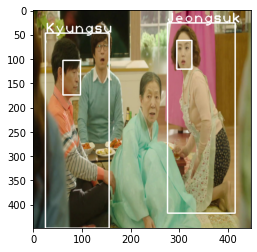

{'frame_id': ['../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/001/0129/IMAGE_0000008093.jpg'], 'place': ['livingroom'], 'persons': {'person_id': ['Jeongsuk', 'Kyungsu'], 'face_rect': [[652, 89, 723, 190], [148, 178, 230, 299]], 'full_rect': [[624, 31, 953, 731], [58, 82, 358, 768]], 'behavior': ['none', ''], 'predicate': ['', ''], 'emotion': ['Surprise', 'Neutral'], 'face_rect_score': ['0.6', '0.4'], 'full_rect_score': ['0.9', '0.9']}}
----------------------1-th----------------frame
place:['livingroom']
num_of_persons:2
person_id:Jeongsuk
face_rect:[652, 89, 723, 190]
full_rect:[624, 31, 953, 731]
behavior:none
predicate:
emotion:Surprise
person_id:Kyungsu
face_rect:[148, 178, 230, 299]
full_rect:[58, 82, 358, 768]
behavior:
predicate:
emotion:Neutral


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


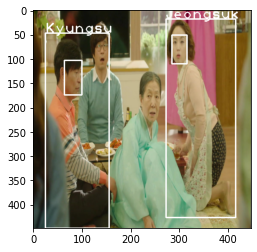

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


{'frame_id': ['../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/001/0129/IMAGE_0000008101.jpg'], 'place': ['livingroom'], 'persons': {'person_id': ['Jeongsuk', 'Kyungsu'], 'face_rect': [[629, 75, 700, 176], [168, 188, 250, 309]], 'full_rect': [[602, 12, 945, 726], [58, 82, 358, 768]], 'behavior': ['none', ''], 'predicate': ['', ''], 'emotion': ['Surprise', 'Neutral'], 'face_rect_score': ['0.6', '0.4'], 'full_rect_score': ['0.9', '0.9']}}
----------------------2-th----------------frame
place:['livingroom']
num_of_persons:2
person_id:Jeongsuk
face_rect:[629, 75, 700, 176]
full_rect:[602, 12, 945, 726]
behavior:none
predicate:
emotion:Surprise
person_id:Kyungsu
face_rect:[168, 188, 250, 309]
full_rect:[58, 82, 358, 768]
behavior:
predicate:
emotion:Neutral


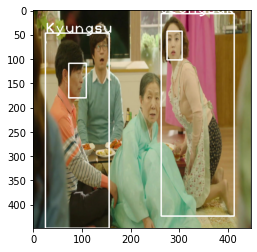

In [92]:
images, info = train_set[51]

# visualize the images and labels
height, width = (768, 1024)
width_ratio = 448 / width
height_ratio = 448 / height

for frm in range(len(images)):
    image = images[frm].cpu().numpy()

    imageInfo = cv2.cvtColor(np.transpose(image,(1,2,0)), cv2.COLOR_RGB2BGR)
    print(info[frm])
    place = info[frm]['place']
    print("----------------------{}-th----------------frame".format(frm))
    num_of_persons = len(info[frm]['persons']['person_id'])
    print("place:{}".format(place))
    print("num_of_persons:{}".format(num_of_persons))

    for p in range(num_of_persons):        
        person_id = info[frm]['persons']['person_id'][p]
        face_rect = info[frm]['persons']['face_rect'][p]
        full_rect = info[frm]['persons']['full_rect'][p]
        behavior = info[frm]['persons']['behavior'][p]
        predicate = info[frm]['persons']['predicate'][p]
        emotion = info[frm]['persons']['emotion'][p]
        
        print("person_id:{}".format(person_id))
        print("face_rect:{}".format(face_rect))
        print("full_rect:{}".format(full_rect))
        print("behavior:{}".format(behavior))
        print("predicate:{}".format(predicate))
        print("emotion:{}".format(emotion))

        # face rect
        xmin = int(max(face_rect[0] * width_ratio, 0))
        ymin = int(max(face_rect[1] * height_ratio, 0))
        xmax = int(min((face_rect[2]) * width_ratio, 448))
        ymax = int(min((face_rect[3]) * height_ratio, 448))
        cv2.rectangle(imageInfo, (xmin, ymin), (xmax, ymax), colors[0], 2)
        
        # full rect
        xmin = int(max(full_rect[0] * width_ratio, 0))
        ymin = int(max(full_rect[1] * height_ratio, 0))
        xmax = int(min((full_rect[2]) * width_ratio, 448))
        ymax = int(min((full_rect[3]) * height_ratio, 448))
        cv2.rectangle(imageInfo, (xmin, ymin), (xmax, ymax), colors[2], 2)
        cv2.putText(imageInfo, person_id, (xmin, ymin), cv2.FONT_HERSHEY_PLAIN, 2, (255, 255, 255), 2)
        
    imageInfo = cv2.cvtColor(imageInfo, cv2.COLOR_BGR2RGB)
    plt.imshow(imageInfo)
    plt.show()

In [93]:
PersonCLS = ['Dokyung', 'Haeyoung1', 'Haeyoung2', 'Sukyung', 'Jinsang',
            'Taejin', 'Hun', 'Jiya', 'Kyungsu', 'Deogi',
            'Heeran', 'Jeongsuk', 'Anna', 'Hoijang', 'Soontack',
            'Sungjin', 'Gitae', 'Sangseok', 'Yijoon', 'Seohee', 'Unknown']

P2PRelCLS = ['Friendly', 'Unfriendly', 'Unknown']

ObjectCLS = ['Phone', 'Stick']
P2ORelCLS = ['Holding', 'Wearing', 'Unknown']

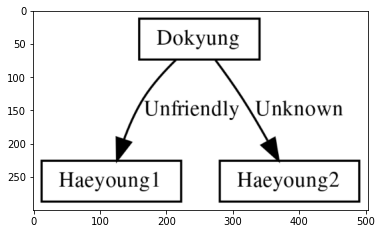

In [94]:
def p2p_relation_digraph(p2p_rel):
    # define direct graph
    dot = Digraph(engine='dot')
    dot.attr('graph', rotate = '0', dpi='300',rankdir='TB', size='4,2')
    dot.attr('node', height='0.1', fontsize='10')
    dot.attr('edge', fontsize='10')

    for n in np.unique(p2p_rel[:, 0:2]): 
        dot.node(PersonCLS[n], shape='rectangle')

    for n in range(len(p2p_rel)): 
        rel = p2p_rel[n]
        dot.edge(PersonCLS[rel[0]], PersonCLS[rel[1]], label=P2PRelCLS[rel[1]])

    dot.format = 'png'
    dot.render('round-table.gv', view=True)

    graph = cv2.imread('round-table.gv.png')
    graph = cv2.resize(graph, dsize=(0, 0), fx=300.0/graph.shape[0], fy=300.0/graph.shape[0])
    plt.imshow(graph)
    plt.show()

p2p_rel = np.stack([[0,1,0], [0,2,1]])
p2p_relation_digraph(p2p_rel)

In [258]:
def person_graph(images,info):
    
    import string
    strseq = string.ascii_uppercase
    
    # for max number of visualizing clusters
    max_graph = min(len(images), len(strseq))
    
    graph_list = []
    for frm in range(max_graph):
        # define  graph
        dot = Graph('G',filename='fdpclust.gv',engine='fdp')
        dot.attr('graph', rotate = '0', dpi='300',rankdir='TB', size='5,5')
        dot.attr('node', height='0.1', fontsize='7')
        dot.attr('edge', fontsize='7')
        
        frm_graph = '{}frame_subgraph'.format(frm)
        dot.node(frm_graph)

        place = "{}".format(info[frm]['place'][0])
        sound = "{}".format('none')
        num_of_persons = len(info[frm]['persons']['person_id'])
        
        with dot.subgraph(name= 'cluster{}'.format(strseq[frm]) ) as fg:
            fg.node(place)
            fg.node(sound)
            
            fg.edge(frm_graph, place)
            fg.edge(frm_graph, sound)
            
            for p in range(num_of_persons):
                try:
                    person_id = "id{}_{}".format(p, info[frm]['persons']['person_id'][p])
                except:
                    continue
                try:
                    behavior = "bhvr{}_{}".format(p,info[frm]['persons']['behavior'][p])
                except:
                    continue
                try:
                    predicate = "pred{}_{}".format(p,info[frm]['persons']['predicate'][p])
                except:
                    continue
                try:
                    emotion = "emt{}_{}".format(p,info[frm]['persons']['emotion'][p])
                except:
                    continue
                
                with fg.subgraph(name='cluster{}'.format(strseq[p])) as pg:
                    pg.attr('graph', rotate = '0', dpi='600',rankdir='TB', size='1')
                    pg.attr('node', height='0.05', fontsize='7')
                    pg.attr('edge', fontsize='7')
                    
                    if person_id is not None:
                        pg.node(person_id)
                    if behavior is not None:
                        pg.node(behavior)
                    if predicate is not None:
                        pg.node(predicate)
                    if emotion is not None:
                        pg.node(emotion)
                    
                    if person_id is not None and behavior is not None:
                        pg.edge(person_id, behavior)
                    if person_id is not None and predicate is not None:
                        pg.edge(person_id, predicate)
                    if person_id is not None and emotion is not None:
                        pg.edge(person_id, emotion)
                    
                fg.edge(frm_graph, 'cluster{}'.format(strseq[p]))
                    
        # show in image
        dot.format = 'png'
        dot.render('fdpclust.gv', view=True)

        graph = cv2.imread('fdpclust.gv.png')
        graph = cv2.resize(graph, dsize=(0, 0), fx=600.0/graph.shape[0], fy=600.0/graph.shape[0])
        graph_list.append(graph)
        plt.figure(figsize=(5,5))
        plt.imshow(graph)
        plt.show()

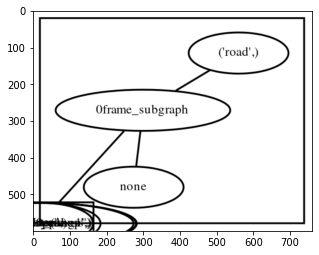

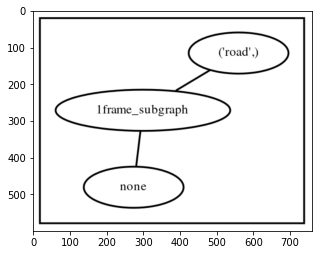

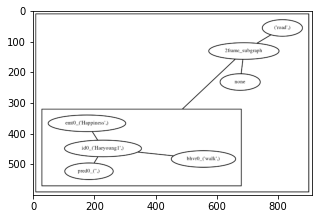

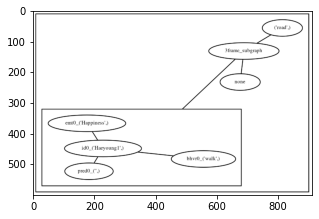

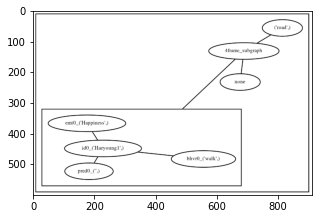

...

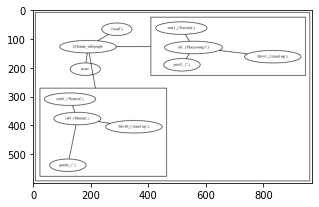

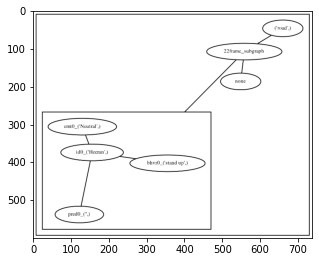

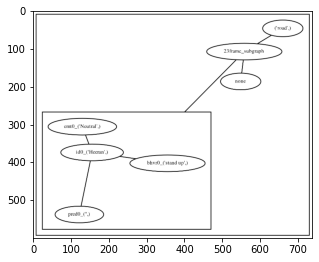

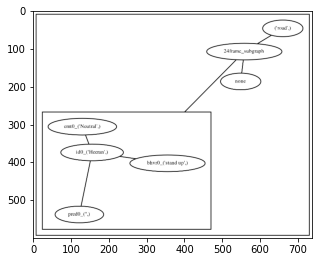

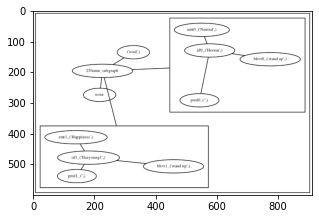

In [259]:
person_graph(images, info)

In [248]:
def groundtruthVisual(it, images, info, display_log=True):
    
    # visualize the images and labels
    height, width = (768, 1024)
    width_ratio = 448 / width
    height_ratio = 448 / height

    for frm in range(len(images)):
        image = images[frm].cpu().numpy()[0]
        imageInfo = cv2.cvtColor(np.transpose(image,(1,2,0)), cv2.COLOR_RGB2BGR)
        
        place = info[frm]['place']
        num_of_persons = len(info[frm]['persons']['person_id'])
        
        if display_log:
            print("----------{}[clip]----------{}[frame]----------".format(it,frm))
            print(info[frm])
            print("place:{}".format(place))
            print("num_of_persons:{}".format(num_of_persons))

        for p in range(num_of_persons):

            person_id = info[frm]['persons']['person_id'][p][0]
            try :
                face_rect = torch.Tensor(info[frm]['persons']['face_rect'][p]).cpu().numpy()
            except :
                continue
                
            try:
                full_rect = torch.Tensor(info[frm]['persons']['full_rect'][p]).cpu().numpy()
            except:
                continue
                
            try: 
                behavior = info[frm]['persons']['behavior'][p][0]
            except:
                continue
            try:
                predicate = info[frm]['persons']['predicate'][p][0]
            except:
                continue
            try:
                emotion = info[frm]['persons']['emotion'][p][0]
            except:
                continue
            
            if display_log:
                print("person_id:{}".format(person_id))
                print("face_rect:{}".format(face_rect))
                print("full_rect:{}".format(full_rect))
                print("behavior:{}".format(behavior))
                print("predicate:{}".format(predicate))
                print("emotion:{}".format(emotion))

            # face rect
            if face_rect is not None :
                fxmin = int(max(face_rect[0] * width_ratio, 0))
                fymin = int(max(face_rect[1] * height_ratio, 0))
                fxmax = int(min((face_rect[2]) * width_ratio, 448))
                fymax = int(min((face_rect[3]) * height_ratio, 448))
                cv2.rectangle(imageInfo, (fxmin, fymin), (fxmax, fymax), colors[0], 2)

            # full rect
            if full_rect is not None :
                bxmin = int(max(full_rect[0] * width_ratio, 0))
                bymin = int(max(full_rect[1] * height_ratio, 0))
                bxmax = int(min((full_rect[2]) * width_ratio, 448))
                bymax = int(min((full_rect[3]) * height_ratio, 448))
                cv2.rectangle(imageInfo, (bxmin, bymin), (bxmax, bymax), colors[2], 2)
                cv2.putText(imageInfo, person_id, (fxmin, fymin), cv2.FONT_HERSHEY_PLAIN, 2, (255, 255, 255), 2)

        imageInfo = cv2.cvtColor(imageInfo, cv2.COLOR_BGR2RGB)
        plt.imshow(imageInfo)
        plt.show()

In [249]:
print("num_training_clips:{}".format(len(train_set)))

train_params = {"batch_size": 1,
                "shuffle": True,
                "drop_last": True}

train_loader = DataLoader(train_set, **train_params)

num_training_clips:1247


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------0[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096273.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Haeyoung1',)], 'face_rect': [[tensor([420]), tensor([112]), tensor([518]), tensor([256])]], 'full_rect': [[tensor([254]), tensor([65]), tensor([649]), tensor([765])]], 'behavior': [('stand up',)], 'predicate': [('',)], 'emotion': [('Happiness',)], 'face_rect_score': [('',)], 'full_rect_score': [('0.9',)]}}
place:[('road',)]
num_of_persons:1
person_id:Haeyoung1
face_rect:[420. 112. 518. 256.]
full_rect:[254.  65. 649. 765.]
behavior:stand up
predicate:
emotion:Happiness


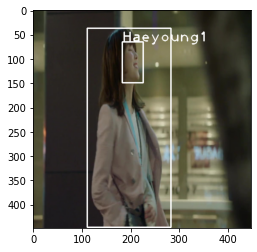

----------0[clip]----------1[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096281.jpg',)], 'place': [('road',)], 'persons': {'person_id': [], 'face_rect': [], 'full_rect': [], 'behavior': [], 'predicate': [], 'emotion': [], 'face_rect_score': [], 'full_rect_score': []}}
place:[('road',)]
num_of_persons:0


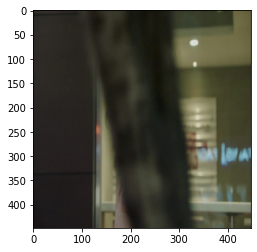

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------2[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096289.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Haeyoung1',)], 'face_rect': [[tensor([597]), tensor([149]), tensor([696]), tensor([275])]], 'full_rect': [[tensor([439]), tensor([96]), tensor([745]), tensor([767])]], 'behavior': [('walk',)], 'predicate': [('',)], 'emotion': [('Happiness',)], 'face_rect_score': [('',)], 'full_rect_score': [('0.9',)]}}
place:[('road',)]
num_of_persons:1
person_id:Haeyoung1
face_rect:[597. 149. 696. 275.]
full_rect:[439.  96. 745. 767.]
behavior:walk
predicate:
emotion:Happiness


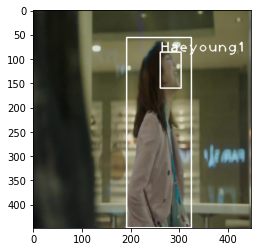

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------3[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096297.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Haeyoung1',)], 'face_rect': [[tensor([709]), tensor([182]), tensor([805]), tensor([333])]], 'full_rect': [[tensor([374]), tensor([83]), tensor([835]), tensor([769])]], 'behavior': [('walk',)], 'predicate': [('',)], 'emotion': [('Happiness',)], 'face_rect_score': [('',)], 'full_rect_score': [('0.9',)]}}
place:[('road',)]
num_of_persons:1
person_id:Haeyoung1
face_rect:[709. 182. 805. 333.]
full_rect:[374.  83. 835. 769.]
behavior:walk
predicate:
emotion:Happiness


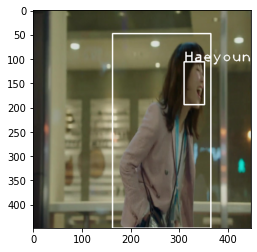

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------4[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096305.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Haeyoung1',)], 'face_rect': [[tensor([795]), tensor([250]), tensor([892]), tensor([401])]], 'full_rect': [[tensor([390]), tensor([109]), tensor([915]), tensor([769])]], 'behavior': [('walk',)], 'predicate': [('',)], 'emotion': [('Happiness',)], 'face_rect_score': [('',)], 'full_rect_score': [('0.9',)]}}
place:[('road',)]
num_of_persons:1
person_id:Haeyoung1
face_rect:[795. 250. 892. 401.]
full_rect:[390. 109. 915. 769.]
behavior:walk
predicate:
emotion:Happiness


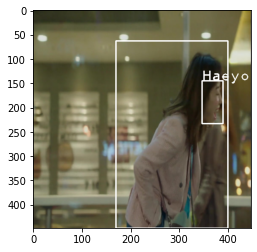

----------0[clip]----------5[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096313.jpg',)], 'place': [('road',)], 'persons': {'person_id': [], 'face_rect': [], 'full_rect': [], 'behavior': [], 'predicate': [], 'emotion': [], 'face_rect_score': [], 'full_rect_score': []}}
place:[('road',)]
num_of_persons:0


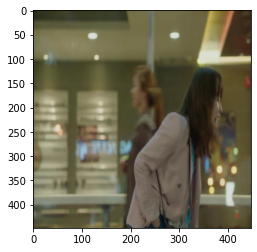

----------0[clip]----------6[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096321.jpg',)], 'place': [('road',)], 'persons': {'person_id': [], 'face_rect': [], 'full_rect': [], 'behavior': [], 'predicate': [], 'emotion': [], 'face_rect_score': [], 'full_rect_score': []}}
place:[('road',)]
num_of_persons:0


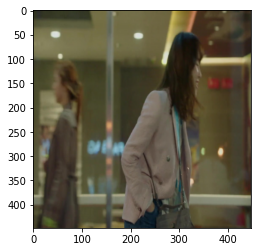

----------0[clip]----------7[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096329.jpg',)], 'place': [('road',)], 'persons': {'person_id': [], 'face_rect': [], 'full_rect': [], 'behavior': [], 'predicate': [], 'emotion': [], 'face_rect_score': [], 'full_rect_score': []}}
place:[('road',)]
num_of_persons:0


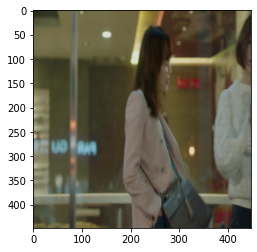

----------0[clip]----------8[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096337.jpg',)], 'place': [('road',)], 'persons': {'person_id': [], 'face_rect': [], 'full_rect': [], 'behavior': [], 'predicate': [], 'emotion': [], 'face_rect_score': [], 'full_rect_score': []}}
place:[('road',)]
num_of_persons:0


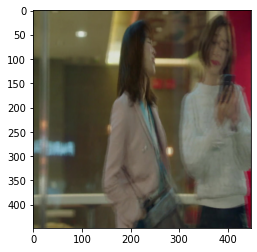

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------9[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096345.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',)], 'face_rect': [[tensor([714]), tensor([65]), tensor([820]), tensor([214])]], 'full_rect': [[tensor([582]), tensor([12]), tensor([987]), tensor([761])]], 'behavior': [('stand up',)], 'predicate': [('has',)], 'emotion': [('Neutral',)], 'face_rect_score': [('0.6',)], 'full_rect_score': [('0.9',)]}}
place:[('road',)]
num_of_persons:1
person_id:Heeran
face_rect:[714.  65. 820. 214.]
full_rect:[582.  12. 987. 761.]
behavior:stand up
predicate:has
emotion:Neutral


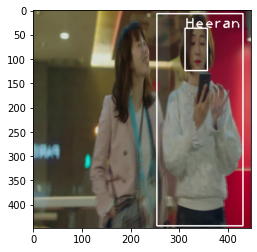

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------10[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096353.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([714]), tensor([65]), tensor([821]), tensor([215])], [tensor([492]), tensor([136]), tensor([571]), tensor([305])]], 'full_rect': [[tensor([582]), tensor([12]), tensor([988]), tensor([761])], [tensor([241]), tensor([26]), tensor([614]), tensor([769])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('has',), ('',)], 'emotion': [('Neutral',), ('Happiness',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[714.  65. 821. 215.]
full_rect:[582.  12. 988. 761.]
behavior:stand up
predicate:has
emotion:Neutral
person_id:Haeyoung1
face_rect:[492. 136. 571. 305.]
full_rect:[241.  26. 614. 769.]
behavior:stand up
predicate:
emotion:Happin

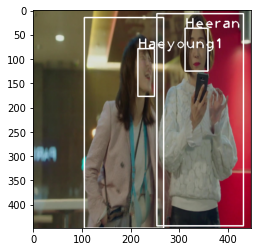

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------11[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096361.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([710]), tensor([90]), tensor([817]), tensor([240])], [tensor([505]), tensor([184]), tensor([584]), tensor([353])]], 'full_rect': [[tensor([582]), tensor([12]), tensor([988]), tensor([761])], [tensor([201]), tensor([50]), tensor([580]), tensor([769])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('has',), ('',)], 'emotion': [('Neutral',), ('Happiness',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[710.  90. 817. 240.]
full_rect:[582.  12. 988. 761.]
behavior:stand up
predicate:has
emotion:Neutral
person_id:Haeyoung1
face_rect:[505. 184. 584. 353.]
full_rect:[201.  50. 580. 769.]
behavior:stand up
predicate:
emotion:Happin

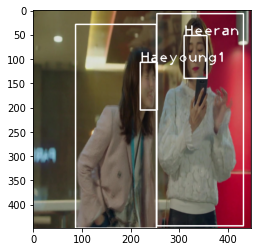

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------12[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096369.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',)], 'face_rect': [[tensor([710]), tensor([90]), tensor([817]), tensor([240])]], 'full_rect': [[tensor([582]), tensor([13]), tensor([988]), tensor([762])]], 'behavior': [('stand up',)], 'predicate': [('has',)], 'emotion': [('Neutral',)], 'face_rect_score': [('0.6',)], 'full_rect_score': [('0.9',)]}}
place:[('road',)]
num_of_persons:1
person_id:Heeran
face_rect:[710.  90. 817. 240.]
full_rect:[582.  13. 988. 762.]
behavior:stand up
predicate:has
emotion:Neutral


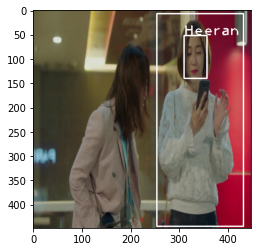

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------13[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096377.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([710]), tensor([90]), tensor([817]), tensor([240])], [tensor([447]), tensor([150]), tensor([522]), tensor([287])]], 'full_rect': [[tensor([582]), tensor([13]), tensor([988]), tensor([762])], [tensor([155]), tensor([69]), tensor([551]), tensor([765])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('has',), ('',)], 'emotion': [('Neutral',), ('Neutral',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[710.  90. 817. 240.]
full_rect:[582.  13. 988. 762.]
behavior:stand up
predicate:has
emotion:Neutral
person_id:Haeyoung1
face_rect:[447. 150. 522. 287.]
full_rect:[155.  69. 551. 765.]
behavior:stand up
predicate:
emotion:Neutral


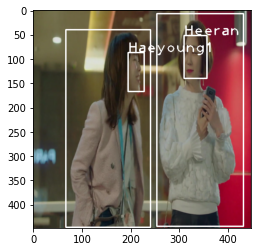

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------14[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096385.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([689]), tensor([109]), tensor([796]), tensor([259])], [tensor([537]), tensor([215]), tensor([612]), tensor([352])]], 'full_rect': [[tensor([582]), tensor([13]), tensor([988]), tensor([762])], [tensor([215]), tensor([73]), tensor([611]), tensor([769])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('has',), ('',)], 'emotion': [('Happiness',), ('Neutral',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[689. 109. 796. 259.]
full_rect:[582.  13. 988. 762.]
behavior:stand up
predicate:has
emotion:Happiness
person_id:Haeyoung1
face_rect:[537. 215. 612. 352.]
full_rect:[215.  73. 611. 769.]
behavior:stand up
predicate:
emotion:Neu

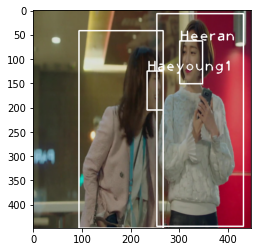

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------15[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096393.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([690]), tensor([109]), tensor([797]), tensor([259])], [tensor([540]), tensor([221]), tensor([615]), tensor([358])]], 'full_rect': [[tensor([582]), tensor([13]), tensor([988]), tensor([762])], [tensor([202]), tensor([73]), tensor([622]), tensor([763])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('has',), ('',)], 'emotion': [('Happiness',), ('Neutral',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[690. 109. 797. 259.]
full_rect:[582.  13. 988. 762.]
behavior:stand up
predicate:has
emotion:Happiness
person_id:Haeyoung1
face_rect:[540. 221. 615. 358.]
full_rect:[202.  73. 622. 763.]
behavior:stand up
predicate:
emotion:Neu

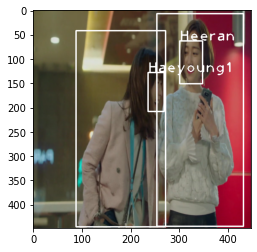

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------16[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096401.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([690]), tensor([109]), tensor([797]), tensor([259])], [tensor([459]), tensor([224]), tensor([534]), tensor([361])]], 'full_rect': [[tensor([582]), tensor([13]), tensor([988]), tensor([762])], [tensor([148]), tensor([79]), tensor([568]), tensor([769])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('has',), ('',)], 'emotion': [('Happiness',), ('Neutral',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[690. 109. 797. 259.]
full_rect:[582.  13. 988. 762.]
behavior:stand up
predicate:has
emotion:Happiness
person_id:Haeyoung1
face_rect:[459. 224. 534. 361.]
full_rect:[148.  79. 568. 769.]
behavior:stand up
predicate:
emotion:Neu

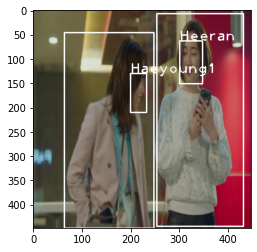

----------0[clip]----------17[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096409.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([679]), tensor([98]), tensor([786]), tensor([248])], [tensor([378]), tensor([196]), tensor([453]), tensor([333])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])], [tensor([127]), tensor([79]), tensor([547]), tensor([769])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('has',), ('',)], 'emotion': [('Happiness',), ('Neutral',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[679.  98. 786. 248.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:has
emotion:Happiness
person_id:Haeyoung1
face_rect:[378. 196. 453. 333.]
full_rect:[127.  79. 547. 769.]
behavior:stand up
predicate:
emotion:Neut

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


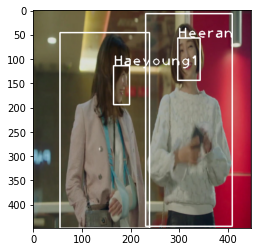

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------18[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096417.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([666]), tensor([98]), tensor([773]), tensor([248])], [tensor([349]), tensor([161]), tensor([424]), tensor([298])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])], [tensor([148]), tensor([79]), tensor([568]), tensor([769])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('',), ('',)], 'emotion': [('Happiness',), ('Neutral',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[666.  98. 773. 248.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:
emotion:Happiness
person_id:Haeyoung1
face_rect:[349. 161. 424. 298.]
full_rect:[148.  79. 568. 769.]
behavior:stand up
predicate:
emotion:Neutral


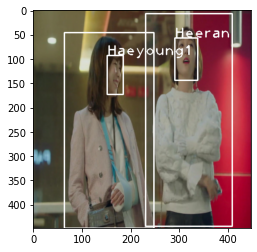

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------19[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096425.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([649]), tensor([98]), tensor([756]), tensor([248])], [tensor([364]), tensor([106]), tensor([439]), tensor([243])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])], [tensor([149]), tensor([79]), tensor([569]), tensor([769])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('',), ('',)], 'emotion': [('Happiness',), ('Neutral',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[649.  98. 756. 248.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:
emotion:Happiness
person_id:Haeyoung1
face_rect:[364. 106. 439. 243.]
full_rect:[149.  79. 569. 769.]
behavior:stand up
predicate:
emotion:Neutral


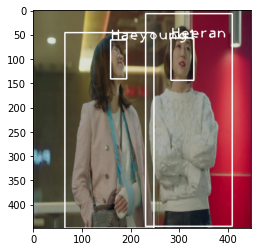

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------20[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096433.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([649]), tensor([98]), tensor([756]), tensor([248])], [tensor([417]), tensor([107]), tensor([492]), tensor([244])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])], [tensor([161]), tensor([46]), tensor([573]), tensor([770])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('',), ('',)], 'emotion': [('Neutral',), ('Neutral',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[649.  98. 756. 248.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:
emotion:Neutral
person_id:Haeyoung1
face_rect:[417. 107. 492. 244.]
full_rect:[161.  46. 573. 770.]
behavior:stand up
predicate:
emotion:Neutral


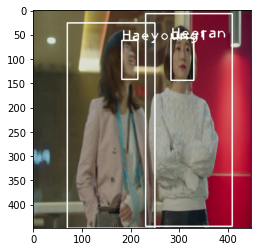

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------21[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096441.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([649]), tensor([98]), tensor([756]), tensor([248])], [tensor([478]), tensor([120]), tensor([553]), tensor([257])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])], [tensor([218]), tensor([45]), tensor([585]), tensor([769])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('',), ('',)], 'emotion': [('Neutral',), ('Neutral',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[649.  98. 756. 248.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:
emotion:Neutral
person_id:Haeyoung1
face_rect:[478. 120. 553. 257.]
full_rect:[218.  45. 585. 769.]
behavior:stand up
predicate:
emotion:Neutral


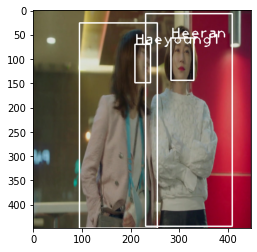

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------22[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096449.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',)], 'face_rect': [[tensor([643]), tensor([102]), tensor([750]), tensor([252])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])]], 'behavior': [('stand up',)], 'predicate': [('',)], 'emotion': [('Neutral',)], 'face_rect_score': [('0.6',)], 'full_rect_score': [('0.9',)]}}
place:[('road',)]
num_of_persons:1
person_id:Heeran
face_rect:[643. 102. 750. 252.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:
emotion:Neutral


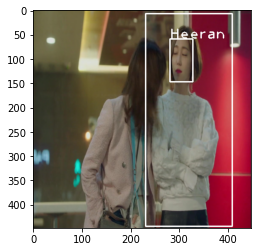

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------23[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096457.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',)], 'face_rect': [[tensor([643]), tensor([125]), tensor([750]), tensor([275])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])]], 'behavior': [('stand up',)], 'predicate': [('',)], 'emotion': [('Neutral',)], 'face_rect_score': [('0.6',)], 'full_rect_score': [('0.9',)]}}
place:[('road',)]
num_of_persons:1
person_id:Heeran
face_rect:[643. 125. 750. 275.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:
emotion:Neutral


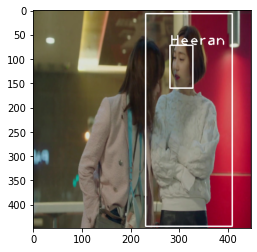

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------24[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096465.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',)], 'face_rect': [[tensor([632]), tensor([125]), tensor([739]), tensor([275])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])]], 'behavior': [('stand up',)], 'predicate': [('',)], 'emotion': [('Neutral',)], 'face_rect_score': [('0.6',)], 'full_rect_score': [('0.9',)]}}
place:[('road',)]
num_of_persons:1
person_id:Heeran
face_rect:[632. 125. 739. 275.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:
emotion:Neutral


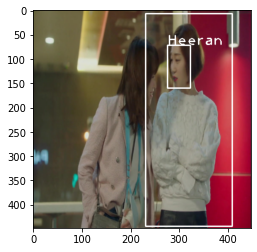

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------25[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096473.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([609]), tensor([141]), tensor([716]), tensor([291])], [tensor([515]), tensor([188]), tensor([575]), tensor([310])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])], [tensor([217]), tensor([46]), tensor([585]), tensor([770])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('',), ('',)], 'emotion': [('Neutral',), ('Happiness',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[609. 141. 716. 291.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:
emotion:Neutral
person_id:Haeyoung1
face_rect:[515. 188. 575. 310.]
full_rect:[217.  46. 585. 770.]
behavior:stand up
predicate:
emotion:Happiness


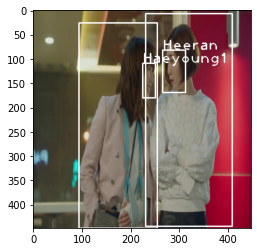

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------26[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096481.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([610]), tensor([141]), tensor([717]), tensor([291])], [tensor([499]), tensor([178]), tensor([559]), tensor([300])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])], [tensor([217]), tensor([46]), tensor([585]), tensor([770])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('',), ('',)], 'emotion': [('Neutral',), ('Happiness',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[610. 141. 717. 291.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:
emotion:Neutral
person_id:Haeyoung1
face_rect:[499. 178. 559. 300.]
full_rect:[217.  46. 585. 770.]
behavior:stand up
predicate:
emotion:Happiness


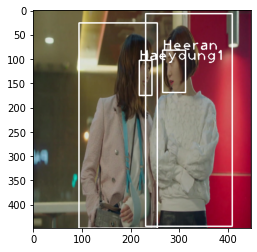

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


----------0[clip]----------27[frame]----------
{'frame_id': [('../data/AnotherMissOh/AnotherMissOh_images/AnotherMissOh01/041/1296/IMAGE_0000096489.jpg',)], 'place': [('road',)], 'persons': {'person_id': [('Heeran',), ('Haeyoung1',)], 'face_rect': [[tensor([610]), tensor([141]), tensor([717]), tensor([291])], [tensor([488]), tensor([178]), tensor([548]), tensor([300])]], 'full_rect': [[tensor([529]), tensor([13]), tensor([935]), tensor([762])], [tensor([217]), tensor([46]), tensor([585]), tensor([770])]], 'behavior': [('stand up',), ('stand up',)], 'predicate': [('',), ('',)], 'emotion': [('Neutral',), ('Happiness',)], 'face_rect_score': [('0.6',), ('',)], 'full_rect_score': [('0.9',), ('0.9',)]}}
place:[('road',)]
num_of_persons:2
person_id:Heeran
face_rect:[610. 141. 717. 291.]
full_rect:[529.  13. 935. 762.]
behavior:stand up
predicate:
emotion:Neutral
person_id:Haeyoung1
face_rect:[488. 178. 548. 300.]
full_rect:[217.  46. 585. 770.]
behavior:stand up
predicate:
emotion:Happiness


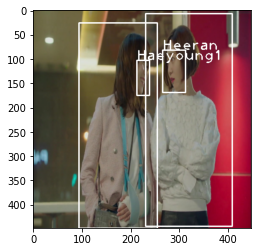

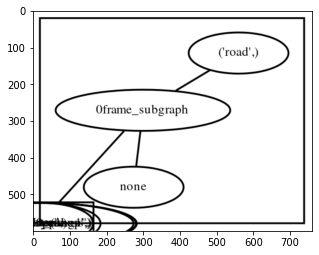

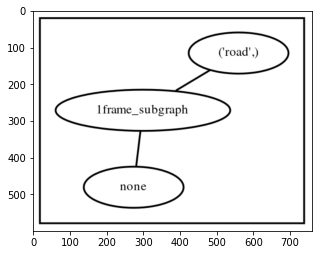

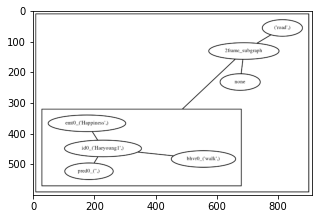

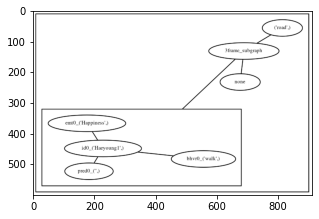

...

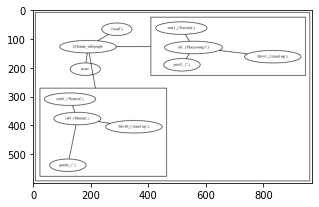

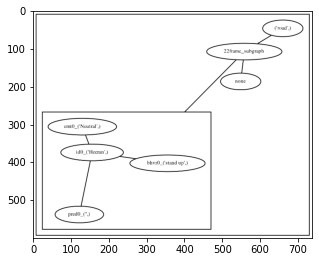

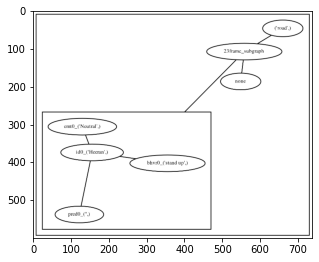

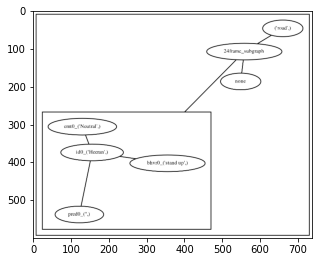

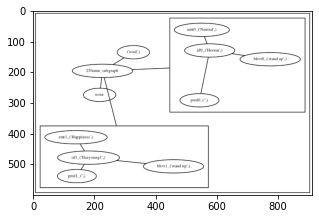

IndexError: string index out of range

In [250]:
for it, batch in enumerate(train_loader):
    images, info = batch
    
    groundtruthVisual(it, images, info)
    person_graph(images,info)
    if it > 10: 
        break;